# Preperation

## Installing necessary packages

In [1]:
!pip install yfinance
!pip install pandas_market_calendars
!pip install matplotlib==3.6.2

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
conda-repo-cli 1.0.4 requires pathlib, which is not installed.



  Attempting uninstall: pytz
    Found existing installation: pytz 2021.3
    Uninstalling pytz-2021.3:
      Successfully uninstalled pytz-2021.3
  Attempting uninstall: lxml
    Found existing installation: lxml 4.8.0
    Uninstalling lxml-4.8.0:
      Successfully uninstalled lxml-4.8.0
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.5.1
    Uninstalling matplotlib-3.5.1:
      Successfully uninstalled matplotlib-3.5.1


## Importing necessary packages

In [1]:
from math import exp, sqrt, log
from scipy.stats import norm
import statsmodels.api as sm
import random
import numpy as np
import pandas as pd

# Disable warnings concerning chained assignments as they are false positives (Task 4 Put-Call regression)
pd.options.mode.chained_assignment = None

import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.offsetbox import AnchoredText
import yfinance as yf
import pandas_market_calendars as mcal
from datetime import datetime, timedelta
import pytz

--------------------------------------------------------------------

# Task 1 - Theoretical European Call Option

Using the three techniques and given values, calculate the price of a European call option.

The European call option is described by the following parameters:

In [2]:
# Parameters of the underlying asset
S_0 = 105 #Current stock Price
r = 0.05 #risk free interest rate
sigma = 0.2 #volatility
T = 0.5 #Time to maturity 1 year = 1, 1 months = 1/12
K = 100 #Strike Price
q = 0 #dividend yield
steps = 100 # time steps
N = 1000 # number of trials
n_periods = 100 # number of periods

Defining a function for the **Black-Scholes model**:

In [3]:
# Defining a function which calculates the price of a European call option:
def Call_blackscholes (S_0: float, r: float, sigma:float, T: float, K:float):
    d_1 = (log(S_0/K) + (r+sigma**2/2)*T)/(sigma*sqrt(T))
    d_2 = (log(S_0/K) + (r-sigma**2/2)*T)/(sigma*sqrt(T))
    C = S_0*norm.cdf(d_1) - K*exp(-r*T)*norm.cdf(d_2)
    return C

Defining a function for the **Monte-Carlo Simulation**:

In [4]:
def geo_paths(S_0, T, r, q, sigma, steps, N):

    dt = T/steps
    #S_{T} = ln(S_{0})+\int_{0}^T(\mu-\frac{\sigma^2}{2})dt+\int_{0}^T \sigma dW(t)
    ST = np.log(S_0) +  np.cumsum(((r - q - sigma**2/2)*dt +\
                              sigma*np.sqrt(dt) * \
                              np.random.normal(size=(steps,N))),axis=0)
    
    return np.exp(ST)
    
# Calculation the price of the European call option with the given parameters

def Call_MonteCarlo(S_0, T, r, q, sigma, steps, N, K):
    
    paths= geo_paths(S_0,T,r, q,sigma,steps,N)
    payoffs = np.maximum(paths[-1]-K, 0)
    MC_optionprice = np.mean(payoffs)*np.exp(-r*T) #discounting back to present value
    return MC_optionprice

Defining a class for European call options with a function for the **Cox-Ross-Rubinstein binomial option model**:

In [5]:
class Call(object):
    def __init__(self, S0, K, rate, sigma, n_periods, tyears):
        self.S0 = S0 # Today's stock price
        self.K = K # Strike Price
        self.rate = rate
        self.sigma = sigma
        self.tyears = tyears
        self.n_periods = n_periods
        self.up_factor = exp(self.sigma * sqrt(self.tyears / self.n_periods))
        self.down_factor = 1 / self.up_factor
        self.tree = self.option_tree()
        self.option_price = self.tree["option_tree"][0][0]

    def option_tree(self):
        p = (np.exp(self.rate * self.tyears / self.n_periods) - self.down_factor) / (self.up_factor - self.down_factor)

        # Option Payoff
        contingent_payoff = lambda st, k: max(st - k, 0)
        contingent_payoff = np.vectorize(contingent_payoff)

        # Creating the branches at different times of the tree
        stock_price_tree = []
        for i in range(1,self.n_periods+1):
            # Number of prices per period
            period_prices = []
            for j in range(i+1):
                up_factor_repeat = i-j
                down_factor_repeat = j

                values = np.append(np.repeat(self.up_factor, up_factor_repeat), 
                        np.repeat(self.down_factor, down_factor_repeat))
                stock_price = values.prod() * self.S0
                period_prices.append(stock_price)
            stock_price_tree.append(period_prices)

        #print(stock_price_tree)
        # Getting the payoff of the call at the end of the tree
        payoffs = contingent_payoff(stock_price_tree[self.n_periods-1], self.K).tolist()

        # payoff of put at period n-1

        #print(self.n_periods)
        
        #for t in range(3):
          #payoffs = contingent_payoff(self.K, stock_price_tree[self.n_periods-t]).tolist()
          #count =+1
          #print(count)
          
        #print(payoffs)
        option_prices = [payoffs]
        # Contingent option price at period n-1
        branch_n = payoffs # brach at n-1

        for t in range(self.n_periods):
            branch_nm1 = []
            for i in range(len(branch_n)-1):
                #cu: Contingent price at time n if price rises
                #cd: Contingent price at time n if price decreases
                cu, cd = np.array(branch_n)[[i, i+1]]
                price = np.exp(-self.rate * self.tyears / self.n_periods)*(p*cu + (1-p)*cd)
                branch_nm1.append(price)
            option_prices.append(branch_nm1)
            branch_n = branch_nm1

        option_prices = option_prices[::-1] 
        stock_price_tree.insert(0, [self.S0])

        return {"stock_tree": stock_price_tree,
                "option_tree": option_prices}

Calculating the price of the theoretical European call option using the three pricing models:

In [6]:
# Set seed for reproducibility
np.random.seed(0)

# Calculation with Black-Scholes model
print("Price (Black-Scholes):")
print("$",round(Call_blackscholes(S_0, r, sigma, T, K), 2), "\n")

# Calculation with Monte-Carlo simulation
print("Price (Monte-Carlo):")
print("$",round(Call_MonteCarlo(S_0, T, r, q, sigma, steps, N, K), 2), "\n")

# Calculation with Cox-Ross-Rubinstein binomial model
print("Price (Cox-Ross-Rubinstein):")
crr = Call(S_0, K, r, sigma, 100, T)
print("$", round(crr.option_price,2))

Price (Black-Scholes):
$ 10.2 

Price (Monte-Carlo):
$ 10.19 

Price (Cox-Ross-Rubinstein):
$ 10.21


Plotting the simulated **Geometric Brownian Motion** of the underlying asset used in the **Monte-Carlo Simulation**:

<Figure size 432x288 with 0 Axes>

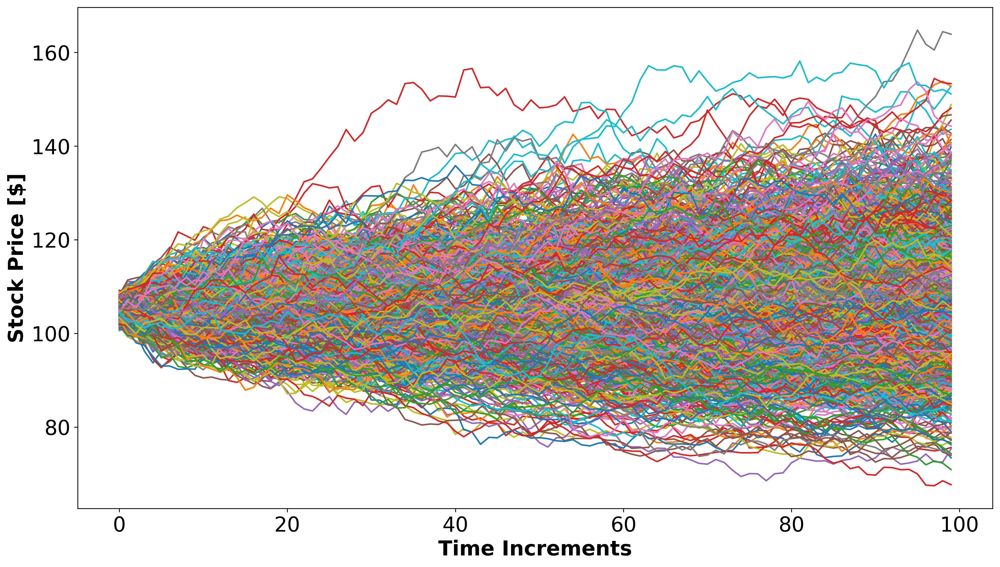

In [9]:
# Set seed for reproducibility
np.random.seed(0)

# Calculating the paths
paths= geo_paths(S_0,T,r, q,sigma,steps,N)

# Creating a figure with one subplot
fig = plt.figure()
fig, ax0 = plt.subplots(nrows=1, ncols=1, figsize = (16,9), dpi=300)

# Plotting the paths
ax0.plot(paths); 
ax0.set_xlabel("Time Increments", size=20, weight="bold")
ax0.set_ylabel("Stock Price [$]", size=20, weight="bold")
ax0.tick_params(labelsize=20)

----------------------------------------------------------------------

# Task 2 - Price Sensitivity Analysis

What is the effect on the price of a call option when the parameter values are changing? Also give an intuition for your results.

1) Calculation of option prices for parameter ranges holding the other parameters constant using the three option pricing models:

In [10]:
# Set seed for reproducibility
np.random.seed(0)

### Defining a reasonable range for each parameter ###
# Current Stock Price (S_0)
rng_S_0 = np.arange(1, 201, 1)
# Strike Price (K)
rng_K = np.arange(1, 201, 1)
# Risk-free rate (r)
rng_r = np.arange(0.01, 1.01, 0.01)
# volatility (sigma)
rng_sigma = np.arange(0.01, 1.01, 0.01)
# time to expiration (T)
rng_T = np.arange(0.25, 10.25, 0.25)
# Combining the ranges in a single array
rng = np.array([rng_S_0, rng_K, rng_r, rng_sigma, rng_T], dtype=object)

### Create an empty numpy arrays to store calculation results for each pricing model ###
C_BS = np.zeros(5, dtype=object)
C_MC = np.zeros(5, dtype=object)
C_CRR = np.zeros(5, dtype=object)

### Calculate the corresponding values of the call option using each pricing model ###
for i in range(0,5):
    params = np.array([S_0, K, r, sigma, T])
    result_BS = np.array([])
    result_MC = np.array([])
    result_CRR = np.array([])
    for j in rng[i]:
        params[i] = j
        
        # Prices for defined parameter ranges
        result_BS = np.concatenate((result_BS,[Call_blackscholes(params[0],params[2],params[3],params[4],params[1])]))
        result_MC = np.concatenate((result_MC,[Call_MonteCarlo(params[0],params[4],params[2],q,params[3],steps, N, params[1])]))
        
        # Initilizing object of class call
        call = Call(params[0], params[1], params[2], params[3], n_periods, params[4])
        result_CRR = np.concatenate((result_CRR,[call.option_price]))
        
    C_BS[i] = result_BS
    C_MC[i] = result_MC
    C_CRR[i] = result_CRR

2) Ploting the results:

Text(107.5, 51.23450474417436, 'Given Value')

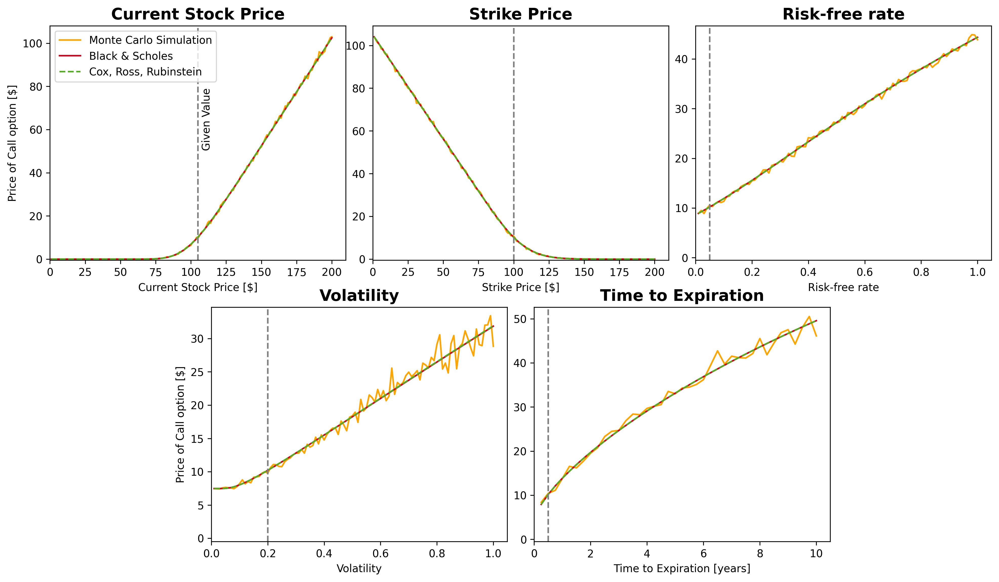

In [11]:
# Creating a figure with five subplot
fig = plt.figure(figsize=(16,9), dpi=300)
ax0 = plt.subplot2grid(shape=(2,6), loc=(0,0), colspan=2)
ax1 = plt.subplot2grid((2,6), (0,2), colspan=2)
ax2 = plt.subplot2grid((2,6), (0,4), colspan=2)
ax3 = plt.subplot2grid((2,6), (1,1), colspan=2)
ax4 = plt.subplot2grid((2,6), (1,3), colspan=2)

ax = np.array([ax0, ax1, ax2, ax3, ax4])
params = np.array([S_0, K, r, sigma, T])
title = np.array(["Current Stock Price", "Strike Price", "Risk-free rate", "Volatility", "Time to Expiration"])
xlabel = np.array(["Current Stock Price [$]", "Strike Price [$]", "Risk-free rate", "Volatility", "Time to Expiration [years]"])

# Plotting the option prices depending on the parameters

for i in range(0,5):
    ax[i].plot(rng[i], C_MC[i], color = "#ffA500", label = "Monte Carlo Simulation")
    ax[i].plot(rng[i], C_BS[i], color = "#CC071E", label = "Black & Scholes")
    ax[i].plot(rng[i], C_CRR[i], color = "#57AB27", linestyle="--", label = "Cox, Ross, Rubinstein")
    ax[i].axvline(params[i],linestyle = "--", color = "0.5")
    ax[i].set_xlim(0)
    ax[i].set_ylim(-0.5)
    ax[i].set_xlabel(xlabel[i])
    ax[i].set_title(title[i], size= 15, weight = "bold")

# Showing legend and text only in first plot
ax0.set_ylabel("Price of Call option [$]")
ax3.set_ylabel("Price of Call option [$]")
ax0.legend()
ax0.text(params[0]+2.5,np.max(C_BS[0])/2,'Given Value',rotation=90)

---------------------------------------------------------

# Task 3 - Theoretical American Put Option

You now need to value an American put option instead. What techniques can you use? What do you need to consider? Using the binomial aproach, value an American put option with the following values:

In [12]:
# Parameters of the underlying asset
S_0 = 100 #Current stock Price
r = 0.05 #risk free interest rate
sigma = 0.45 #volatility
T = 1 #Time to maturity 1 year = 1, 1 months = 1/12
K = 100 #Strike Price
q = 0 #dividend yield
steps = 100 # time steps
N = 1000 # number of trials
n_periods = 30 # number of periods

Defining a class for American Put options with a function for the **Cox-Ross-Rubinstein binomial option model**:

In [13]:
class Put(object):
    def __init__(self, S0, K, rate, sigma, n_periods, tyears):
        self.S0 = S0 # Today's stock price
        self.K = K # Strike Price
        self.rate = rate
        self.sigma = sigma
        self.tyears = tyears
        self.n_periods = n_periods
        self.up_factor = exp(self.sigma * sqrt(self.tyears / self.n_periods))
        self.down_factor = 1 / self.up_factor
        self.tree = self.option_tree()
        self.option_price = self.tree["option_tree"][0][0]

    def option_tree(self):
        p = (np.exp(self.rate * self.tyears / self.n_periods) - self.down_factor) / (self.up_factor - self.down_factor)

        # Option Payoff
        contingent_payoff = lambda st, k: max(k - st, 0)
        contingent_payoff = np.vectorize(contingent_payoff)

        # Creating the branches at different times of the tree
        stock_price_tree = []
        for i in range(1,self.n_periods+1):
            # Number of prices per period
            period_prices = []
            for j in range(i+1):
                up_factor_repeat = i-j
                down_factor_repeat = j

                values = np.append(np.repeat(self.up_factor, up_factor_repeat), 
                        np.repeat(self.down_factor, down_factor_repeat))
                stock_price = values.prod() * self.S0
                period_prices.append(stock_price)
            stock_price_tree.append(period_prices)
        # Getting the payoff of the call at the end of the tree
        payoffs = contingent_payoff(stock_price_tree[self.n_periods-1], self.K).tolist()
        
        payoff_put = []
        for i in range(self.n_periods):
            payoff_put.append(contingent_payoff(stock_price_tree[i], self.K).tolist())
          
        option_prices = [payoff_put[-1]]
    
        outer_count = 0
        for t in range(1,self.n_periods):
            branch_n = payoff_put[-t]
            branch_nm1 = []
            inner_count = 0
            for i in range(len(branch_n)-1):
                #cu: Contingent price at time n if price rises
                #cd: Contingent price at time n if price decreases
                cu, cd = np.array(branch_n)[[i, i+1]]
                inner_count += 1
                price = np.exp(-self.rate * self.tyears / self.n_periods)*(p*cu + (1-p)*cd)
                branch_nm1.append(price)
            option_prices.append(branch_nm1)
            outer_count += 1
            branch_n = branch_nm1
        option_prices = option_prices[::-1] 
        stock_price_tree.insert(0, [self.S0])
        payoff_put.insert(0, [self.K - self.S0])
        #optioin_tree
        co,cg = np.array(payoff_put[1])[[0,1]]
        f_price = np.exp(-self.rate * self.tyears / self.n_periods)*(p*co + (1-p)*cg)
        option_prices.insert(0, [f_price])
        
        return {"stock_tree": stock_price_tree,
                "option_tree": option_prices,
            "payoffs":payoff_put}

Calculating the price of the theoretical American put option using the Cox-Ross-Rubinstein binomial model:

1) Calculate the price of the option if we let it converge against maximum timesteps.

In [16]:
# Create empty numpy array to store calculation results
option_prices= np.array([])

# Define reasonable range of time steps
rng_t = np.arange(1, 1050, 50).tolist()

# Calculate the corresponding values for the option
for i in rng_t:
    option_prices = np.concatenate((option_prices,[Put(S_0, K, r, sigma, i, T).option_price]))

2) Plotting the conversion of the price:

<Figure size 432x288 with 0 Axes>

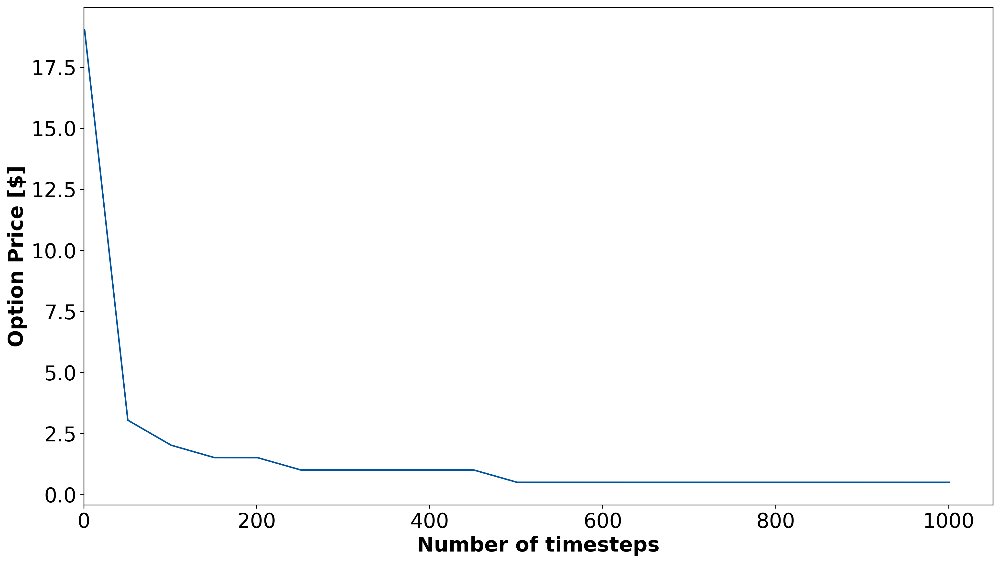

In [17]:
# minimum calculated option price and corresponding n_period
min_price = np.min(option_prices)
n_period = rng_t[np.argmin(option_prices)]

# Creating a figure with one subplot
fig = plt.figure()
fig, ax0 = plt.subplots(nrows=1, ncols=1, figsize = (16,9), dpi=300)

# Plotting the option price with variable time steps
ax0.plot(rng_t, option_prices, color = "#00549f")
ax0.set_xlabel("Number of timesteps", size=20, weight="bold")
ax0.set_ylabel("Option Price [$]", size=20, weight="bold")
ax0.set_xlim(0)
ax0.tick_params(labelsize=20)
#ax0.annotate("$"+str(round(min_price,2)), xy=(n_period, min_price), xycoords='data', xytext=(0.85,0.15), textcoords='axes fraction',arrowprops=dict(width=3, connectionstyle="arc3,rad=0", color="0.0"),bbox=dict(boxstyle="round", fc="1.0", ec="0.0"), size=20)

---------------------------------------------

# Task 4 - Exchange traded options

Choose a stock of your liking and get data for the price of the option on this stock. What are parameters and the market price of the option? Now try to compute the value of the option with your own models. How can you determine all necessary parameters? How does the fair value compare to the actual price?

## Call Options on NFLX stock

Importing the data for **NFLX stock** from Yahoo Finance and calculating the log-returns:

In [7]:
# Extract data on the price of the stock from Yahoo finance
nflx = yf.Ticker("NFLX")
stock_prices = nflx.history(period="5y", interval="1d")

# Calculating the log-returns
stock_prices["logreturn"] = np.log(stock_prices.Close) - np.log(stock_prices.Close.shift(1))

Plotting the Closing Price of the underlying asset:

<Figure size 432x288 with 0 Axes>

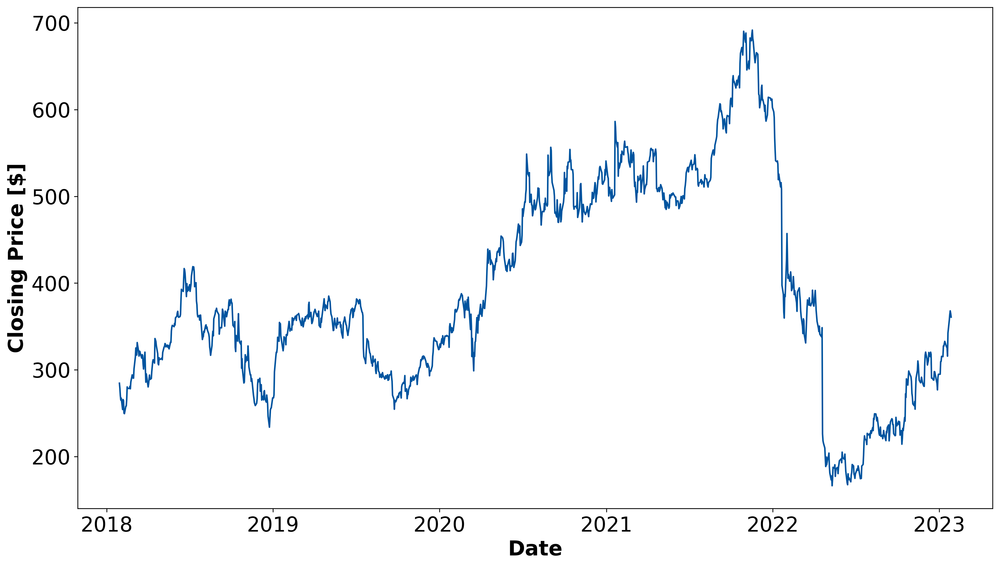

In [8]:
# Creating a figure with one subplot #
fig = plt.figure()
fig, ax0 = plt.subplots(nrows=1, ncols=1, figsize = (16,9), dpi=300)

# Plotting the Closing Price the stock
ax0.plot(stock_prices.index, stock_prices["Close"], color = "#00549f")
ax0.set_xlabel("Date", size=20, weight="bold")
ax0.set_ylabel("Closing Price [$]", size=20, weight="bold")
ax0.tick_params(labelsize=20)

Importing the call option data for the **NFLX stock** from Yahoo Finance and calculating necessary parameters:

In [9]:
# Todays date
today = datetime.now(pytz.utc).strftime('%Y-%m-%d')

# Todays date and time
today_time = datetime.now(pytz.utc).strftime('%Y-%m-%d %H:%M') + " UTC"

# Create a calendar for the Chicago Board Options Exchange
cboe = mcal.get_calendar('CBOE_Index_Options')

# Extract expiration dates of option prices from Yahoo finance
expiration = nflx.options


# Extract call option chains for all expiration dates
calls = pd.DataFrame()
for e in expiration:
  
    ### Extracting options data ###
    # Extract call options
    calls_e = nflx.option_chain(e).calls

    # Extract put options
    puts_e = nflx.option_chain(e).puts

    # Drop rows for which no bid or ask price currently exists on the market
    calls_e.drop(calls_e[(calls_e["bid"] == 0) | (calls_e["ask"] == 0)].index, inplace=True)
    puts_e.drop(puts_e[(puts_e["bid"] == 0) | (puts_e["ask"] == 0)].index, inplace=True)

    # Add column representing the midpoint between ask and bid price
    calls_e["midpoint"] = (calls_e["ask"]+calls_e["bid"])/2
    puts_e["midpoint"] = (puts_e["ask"]+puts_e["bid"])/2

    # Set the strike price as the index and drop the strike column
    calls_e.index = calls_e["strike"]
    calls_e.drop(columns="strike", inplace = True)
    puts_e.index = puts_e["strike"]
    puts_e.drop(columns="strike", inplace = True)

    
    ### Underlying asset: Closing Price of previous trading day ###
    S_yda = stock_prices["Close"][-1]
    
    
    ### Calculate the time to maturity ###
    # Create a trading day range starting today until the expiration date
    tradingDayRange = mcal.date_range(cboe.schedule(start_date=today, end_date=e), frequency='1D')

    # Time to Maturity in days
    T_days = len(tradingDayRange)

    # Time to Maturrty in years
    T_years = T_days/252


    ### Calculate the volatility ###
    # Calculating the volatility of the log-returns for the last T_days trading days
    if T_days > 1:
        volatility = np.sqrt(np.var(stock_prices["logreturn"].tail(T_days), ddof = 1)) * np.sqrt(252)
    else:
        volatility = np.nan


    ### Calculate the difference between Put and Call Price ###
    # strike prices for which put and call prices exist
    strike = list(set.intersection(set(puts_e.index), set(calls_e.index)))
  
    if len(strike) > 1: # otherwise regression based on this difference will not work
        # Calculate the difference between the Put and the Call price
        cp_diff = puts_e.loc[strike, "midpoint"] - calls_e.loc[strike, "midpoint"]

  
    ### Set attributes ###
    calls_e["expiration"] = e
    calls_e["T_days"] = T_days
    calls_e["T_years"] = T_years
    calls_e["S_yda"] = S_yda
    calls_e["volatility"] = volatility
    if len(strike)>1: 
        calls_e.loc[strike, "cp_diff"] = cp_diff
    calls_e["extraction"] = today_time

    ### Change Data Type of column "lastTradeDate"
    calls_e["lastTradeDate"] = calls_e["lastTradeDate"].dt.strftime('%Y-%m-%d %H:%M') + " UTC"

    # reset index
    calls_e.reset_index(inplace=True)

    # Combine call options into a single dataframe
    calls = pd.concat([calls, calls_e], ignore_index=True)

# Show the first five rows of the Dataframe
calls.head()

,strike,contractSymbol,lastTradeDate,lastPrice,bid,ask,change,percentChange,volume,openInterest,...,contractSize,currency,midpoint,expiration,T_days,T_years,S_yda,volatility,cp_diff,extraction
0,100.0,NFLX230203C00100000,2022-12-27 20:51 UTC,185.00,263.35,267.15,0.000000,0.000000,NaN,7,...,REGULAR,USD,265.250,2023-02-03,5,0.019841,360.769989,0.34781,NaN,2023-01-29 17:25 UTC
1,160.0,NFLX230203C00160000,2023-01-20 14:30 UTC,175.76,199.55,202.60,0.000000,0.000000,2.0,37,...,REGULAR,USD,201.075,2023-02-03,5,0.019841,360.769989,0.34781,NaN,2023-01-29 17:25 UTC
2,170.0,NFLX230203C00170000,2023-01-20 14:43 UTC,171.63,189.60,192.85,0.000000,0.000000,32.0,56,...,REGULAR,USD,191.225,2023-02-03,5,0.019841,360.769989,0.34781,NaN,2023-01-29 17:25 UTC
3,180.0,NFLX230203C00180000,2023-01-23 20:51 UTC,176.55,179.70,182.60,0.000000,0.000000,115.0,151,...,REGULAR,USD,181.150,2023-02-03,5,0.019841,360.769989,0.34781,NaN,2023-01-29 17:25 UTC
4,195.0,NFLX230203C00195000,2023-01-27 18:07 UTC,168.50,164.65,166.90,1.130005,0.675154,1.0,75,...,REGULAR,USD,165.775,2023-02-03,5,0.019841,360.769989,0.34781,NaN,2023-01-29 17:25 UTC


Indentfying options which can be classified as outliers in regards to open interest (> 1.5 IQR + Q3):

In [10]:
# Calculate the interquartile range
oi_iqr = np.quantile(calls["openInterest"], q=0.75)-np.quantile(calls["openInterest"], q=0.25)

# Calculate the lower boundery for outliers
upper = 1.5*oi_iqr+np.quantile(calls["openInterest"], q=0.75)

# All options with an open Interest higher than the specified lower boundry can be considered an outlier 
calls["openInterest_Outlier"] = calls["openInterest"] > upper

Exporting the data for further examination and reproducibility to excel (optional step)

In [143]:
path = r"C:\Users\juliu\Documents\Uni\ws22\Data Science im Finanzbereich [Aktuelles Thema] (SE) [22ws-81.50000]\Option Pricing\Data\NFLX.xlsx"
calls.to_excel(path, index=False)

--------------------------------------------------------------------------------------

Importing data from excel for further examination and reproducibility to excel (optional step)

In [11]:
# Import dataset
path = r"C:\Users\juliu\Documents\Uni\ws22\Data Science im Finanzbereich [Aktuelles Thema] (SE) [22ws-81.50000]\Option Pricing\Data\NFLX_230111_final.xlsx"
calls = pd.read_excel(path)

# Extract the contained expiration dates
expiration = np.array(calls["expiration"].unique())

# Show the first five rows of the Dataframe
calls.head()

,strike,contractSymbol,lastTradeDate,lastPrice,bid,ask,change,percentChange,volume,openInterest,...,currency,midpoint,expiration,T_days,T_years,S_yda,volatility,cp_diff,extraction,openInterest_Outlier
0,130.0,NFLX230113C00130000,2022-12-20 14:37 UTC,154.99,193.20,197.85,0.0,0.0,11.0,0,...,USD,195.525,2023-01-13,3,0.011905,327.024994,0.365584,NaN,2023-01-11 19:31 UTC,False
1,140.0,NFLX230113C00140000,2022-12-30 15:40 UTC,148.40,183.35,187.40,0.0,0.0,1.0,80,...,USD,185.375,2023-01-13,3,0.011905,327.024994,0.365584,NaN,2023-01-11 19:31 UTC,False
2,150.0,NFLX230113C00150000,2023-01-03 19:45 UTC,146.35,173.50,177.80,0.0,0.0,1.0,96,...,USD,175.650,2023-01-13,3,0.011905,327.024994,0.365584,NaN,2023-01-11 19:31 UTC,False
3,160.0,NFLX230113C00160000,2023-01-04 16:21 UTC,146.06,164.20,166.65,0.0,0.0,100.0,25,...,USD,165.425,2023-01-13,3,0.011905,327.024994,0.365584,NaN,2023-01-11 19:31 UTC,False
4,170.0,NFLX230113C00170000,2022-12-29 20:04 UTC,120.02,153.90,156.70,0.0,0.0,31.0,9,...,USD,155.300,2023-01-13,3,0.011905,327.024994,0.365584,NaN,2023-01-11 19:31 UTC,False


Specify the expiration date which should be used for further analysis of option prices:

In [12]:
# Expiration date for further analysis
exp_date = "2023-06-16"

For an overview over the entire market of call options on the **NFLX stock** the market prices are plotted depending on time to expiration and strike price (outliers with regards to open Interest are plotted in red):

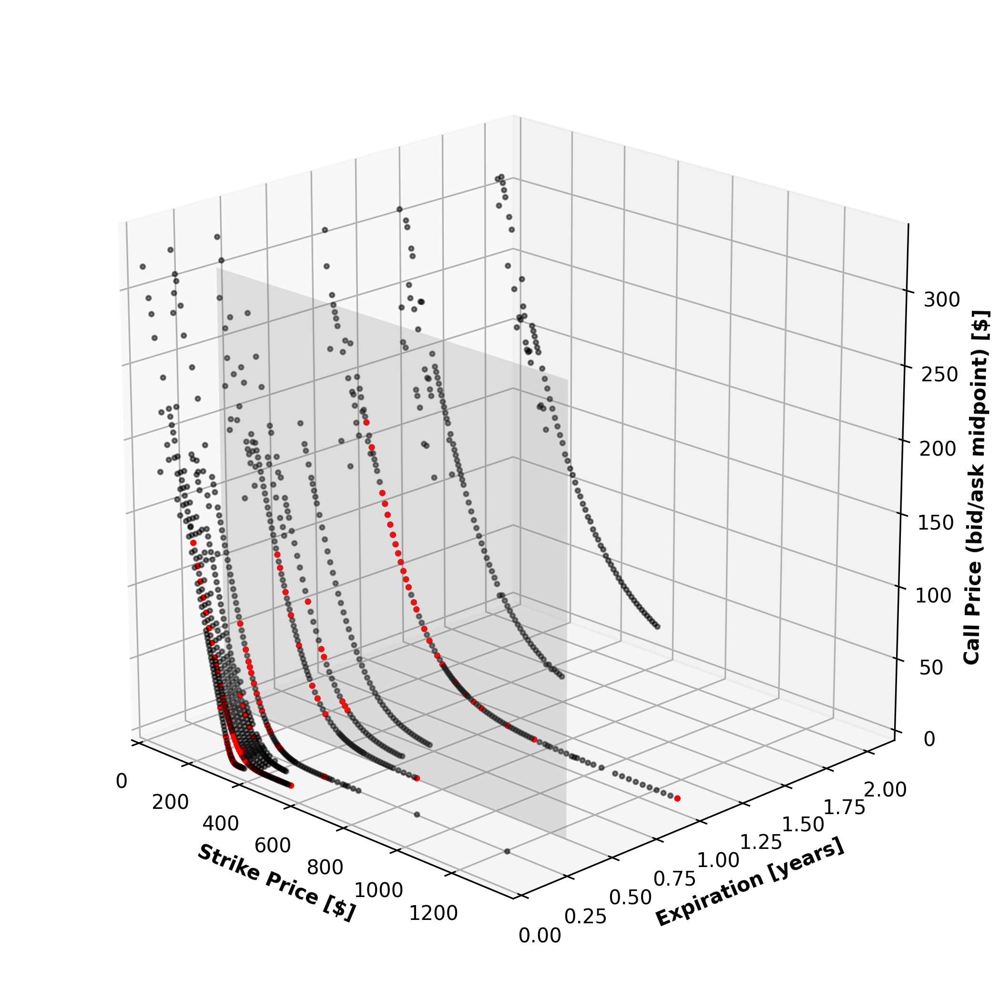

In [13]:
# Creating a surface area indicating the option under further investigation
X = np.arange(0,np.max(calls["strike"]), step=100)
Y = calls[calls["expiration"] == exp_date]["T_years"].iloc[0]
Z = np.arange(0,np.max(calls["midpoint"]), step=100)
X, Z = np.meshgrid(X, Z)

# Creating a figure with one 3D subplot
fig = plt.figure(figsize=(16,9), dpi=300)
ax0 = fig.add_subplot(projection='3d')

# Plotting all option prices
ax0.scatter(xs = calls[calls["openInterest_Outlier"]]["strike"], ys = calls[calls["openInterest_Outlier"]]["T_years"], zs = calls[calls["openInterest_Outlier"]]["midpoint"], s=5, color="red", alpha=1)
ax0.scatter(xs = calls[calls["openInterest_Outlier"]==False]["strike"], ys = calls[calls["openInterest_Outlier"]==False]["T_years"], zs = calls[calls["openInterest_Outlier"]==False]["midpoint"], color="black", s=5, alpha=0.5)
ax0.plot_surface(X, Y, Z, color="0.5", alpha=0.2)
ax0.set_xlim(0)
ax0.set_ylim(0)
ax0.set_zlim(0)
ax0.set_xlabel("Strike Price [$]", weight="bold")
ax0.set_ylabel("Expiration [years]", weight="bold")
ax0.set_zlabel("Call Price (bid/ask midpoint) [$]", weight="bold")
ax0.view_init(20,-45)
ax0.set_box_aspect(aspect=(1,1,1),zoom=0.95)

Put-Call Parity regression analysis to determine the implied riskfree rate and the implied current price of the NFLX stock.
(Only near-the-money options are considered (0.65<K/S_yda<1.35))

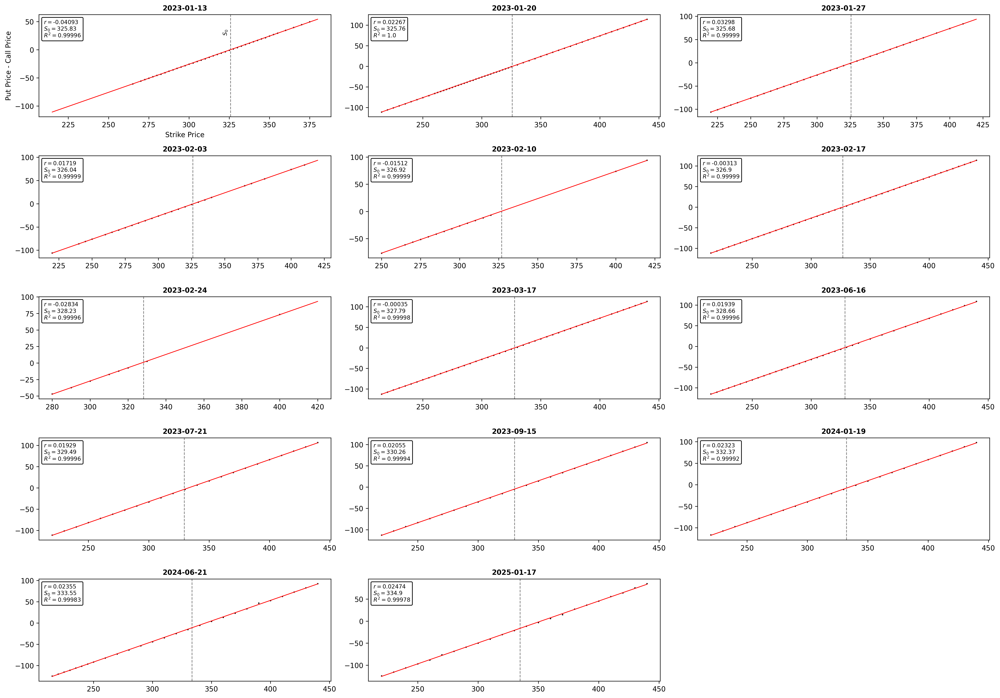

In [14]:
# Columns in the figure
cols = 3

# Rows in the figure
rows = len(expiration)//cols
if len(expiration)%cols != 0:
    rows += 1
    
# Plot Position range
position = range(1, len(expiration) + 1)

# Creating a figure
fig = plt.figure(figsize=(20,14), dpi=300)

for i in range(0,len(expiration)):
        
        ### Subset of calls Dataframe ###
        calls_e = calls[calls["expiration"]==expiration[i]]
        
        # New Column representing the K/S_yda ratio
        S_yda = calls_e["S_yda"].iloc[0]
        ratio = calls_e["strike"].divide(S_yda)
        calls_e["K/S_yda"] = ratio
        
        # Filter options that can be considered near-the-money
        upper = 1.35
        lower = 0.65
        calls_e = calls_e[(calls_e["K/S_yda"]>lower) & (calls_e["K/S_yda"]<upper)]
        
        # Option Parameters
        strike = calls_e["strike"]
        T_years = calls_e["T_years"].iloc[0]
        cp_diff = calls_e["cp_diff"]
        
        ### Regression ###
        # exogenous variables
        exogen = np.asarray(strike)
        exogen = sm.add_constant(exogen)

        # endogenous variable
        endogen = np.asarray(cp_diff)

        # fitting the model to the data
        model = sm.OLS(endogen, exogen, missing="drop")
        results = model.fit()
        
        # Regression results
        alpha = results.params[0]
        beta = results.params[1]
        r2 = results.rsquared
        
        # Prediction of difference between put and call price according to regression
        cp_pred = alpha + strike * beta
        
        ### Implied Parameters ###
        # implied riskfree rate
        riskfree = -(1/T_years)*np.log(beta)
        
        # implied current Stock price
        S_0 = - alpha
        
        ### Saving the implied Parameters and Regression parameters in the Calls Dataframe ###
        calls.loc[calls["expiration"]==expiration[i],"alpha"] = alpha
        calls.loc[calls["expiration"]==expiration[i],"beta"] = beta
        calls.loc[calls["expiration"]==expiration[i],"r2"] = r2        
        calls.loc[calls["expiration"]==expiration[i],"riskfree rate"] = riskfree
        calls.loc[calls["expiration"]==expiration[i],"S_0"] = S_0
        
        ### Plotting the results ###
        # Create new subplot on the defined figure
        ax = fig.add_subplot(rows,cols,position[i])
        ax.axvline(S_0, linestyle="--", color="0.5", linewidth=1)
        ax.plot(strike, cp_pred, color = "red", linewidth = 1)
        ax.scatter(strike, cp_diff, s=1, color="black")
        ax.set_title(expiration[i], size=10, weight="bold")
        
        # Text to annotate vertical line and axis labels in the first subplot
        if i == 0:
            ax.set_ylabel("Put Price - Call Price", size=10)
            ax.set_xlabel("Strike Price", size=10)
            textx = S_0-(np.max(strike) - np.min(strike))*0.03
            texty = (np.max(cp_diff)-np.min(cp_diff))*4/5+np.min(cp_diff)
            ax.text(textx,texty,'$S_0$',rotation=90, size=8)
        
        # Annotation with R2 and implied parameters
        at = AnchoredText("$r=$"+str(round(riskfree,5))+"\n$S_0=$"+str(round(S_0,2))+"\n$R^2=$"+str(round(r2,5)), prop=dict(size=8), frameon=True, loc='upper left')
        at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2")
        ax.add_artist(at)

# Set tight layout
fig.tight_layout()

Comparing the calculated prices applying the pricing models to the actual market prices:

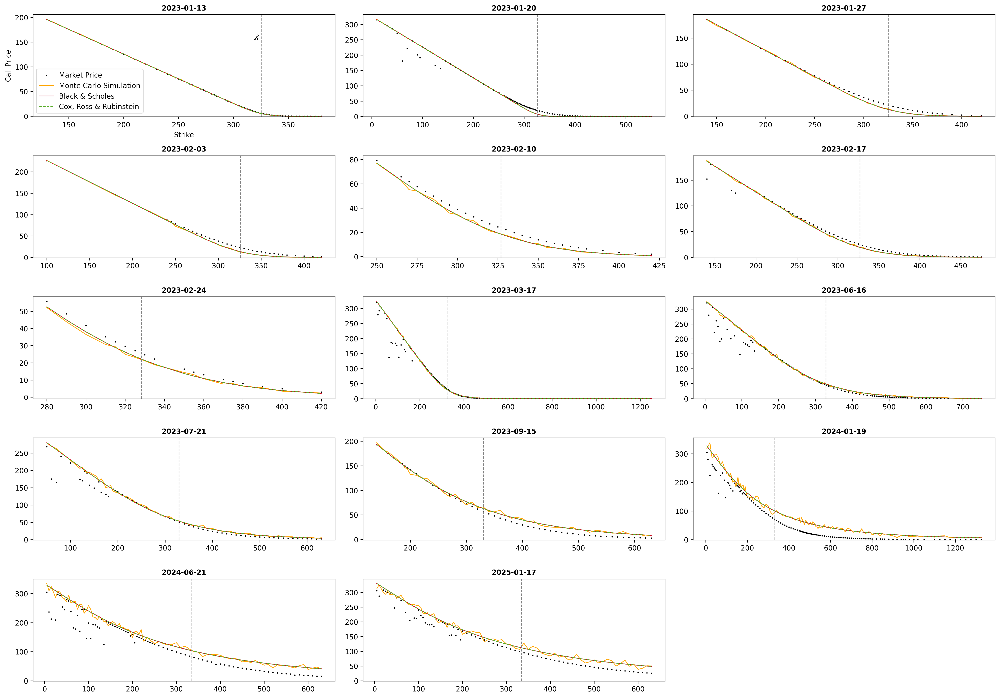

In [15]:
# Set seed for reproducibility
np.random.seed(0)

# Columns in the figure
cols = 3

# Rows in the figure
rows = len(expiration)//cols
if len(expiration)%cols != 0:
    rows += 1
    
# Plot position range
position = range(1, len(expiration) + 1)

# Creating a figure
fig = plt.figure(figsize=(20,14), dpi=300)

for i in range(0,len(expiration)):
        
        ### Subset of Calls Dataframe ###
        calls_e = calls[calls["expiration"]==expiration[i]]
        
        # Parameters of the underlying asset
        S_0 = calls_e["S_0"].iloc[0] #Current stock Price
        r = calls_e["riskfree rate"].iloc[0] #risk free interest rate
        sigma = calls_e["volatility"].iloc[0] #volatility
        T = calls_e["T_years"].iloc[0] #Time to maturity 1 year = 1, 1 months = 1/12
        q = 0 #dividend yield
        steps = 100 # time steps
        N = 1000 # number of trials
        n_periods = 100 # number of periods
        
        
        ### Calculate the corresponding values of the call option using the three models ###
        # Create an empty numpy arrays to store calculation results
        C_BS = np.array([])
        C_MC = np.array([])
        C_CRR = np.array([])
        
        # Calculate the results using the above defined functions
        for j in calls_e["strike"]:
            C_BS = np.concatenate((C_BS,[Call_blackscholes(S_0,r,sigma,T,j)]))
            C_MC = np.concatenate((C_MC, [Call_MonteCarlo(S_0, T, r, q, sigma, steps, N, j)]))
            
            # Initializing the Call class and calculating the call price
            nflx_call = Call(S_0, j, r, sigma, n_periods, T)
            C_CRR = np.concatenate((C_CRR, [nflx_call.option_price]))
        
        
        ### Saving the calculation results in the Calls Dataframe
        calls.loc[calls["expiration"]==expiration[i],"C_BS"] = C_BS
        calls.loc[calls["expiration"]==expiration[i],"C_MC"] = C_MC
        calls.loc[calls["expiration"]==expiration[i],"C_CRR"] = C_CRR
        
        
        ### Plotting the results ###
        # Create new subplot on the defined figure
        ax = fig.add_subplot(rows,cols,position[i])
        ax.scatter(calls_e["strike"], calls_e["midpoint"], color = "black", label="Market Price", s=1)
        ax.plot(calls_e["strike"], C_MC, color = "#ffA500", linewidth=1, label="Monte Carlo Simulation")
        ax.plot(calls_e["strike"], C_BS, color = "#CC071E", linewidth=1, label="Black & Scholes")
        ax.plot(calls_e["strike"], C_CRR, color = "#57AB27", linestyle="--", linewidth=1, label="Cox, Ross & Rubinstein")
        ax.axvline(S_0 ,linestyle = "--", color = "0.5", linewidth=1)
        ax.set_ylim(-1)
        ax.set_title(expiration[i], size=10, weight="bold")
        
        # Text to annotate vertical line, axis labels and legend in the first subplot
        if i == 0:
            ax.set_ylabel("Call Price", size=10)
            ax.set_xlabel("Strike", size=10)
            textx = S_0-(np.max(calls_e["strike"]) - np.min(calls_e["strike"]))*0.03
            texty = (np.max(calls_e["midpoint"])-np.min(calls_e["midpoint"]))*4/5+np.min(calls_e["midpoint"])
            ax.text(textx,texty,'$S_0$',rotation=90, size=8)
            ax.legend(loc="lower left")

# Set tight layout
fig.tight_layout()

### More detailed analysis of subset

Filter dataset to the specified expiration date to get the subset for detailed analysis:

In [16]:
# Filter the calls Dataframe
subset = calls[calls["expiration"]==exp_date]

# Reset the index of the subset dataframe
subset.reset_index(inplace=True)

Parameters for the options in the selected subset:

In [17]:
# Parameters of the underlying asset
S_0 = subset["S_0"][0] #Current stock Price
r = subset["riskfree rate"][0] #risk free interest rate
sigma = subset["volatility"][0] #volatility
T = subset["T_years"][0] #Time to maturity 1 year = 1, 1 months = 1/12
q = 0 #dividend yield
steps = 100 # time steps
N = 1000 # number of trials
n_periods = 100 # number of periods

print("Expiartion:", exp_date, "\n")
print("S_0:\t\t", S_0)
print("r:\t\t", r)
print("sigma:\t\t", sigma)
print("q:\t\t", q)
print("T:\t\t", T)
print("Steps\t\t", steps)
print("N:\t\t", N)
print("n_periods:\t", n_periods)

Expiartion: 2023-06-16 

S_0:		 328.6577580904789
r:		 0.019389385307154682
sigma:		 0.554247528847181
q:		 0
T:		 0.4325396825396826
Steps		 100
N:		 1000
n_periods:	 100


Plot the Put Call Parity regression for the selected subset:

53198.04858536692
3640215.032476191


<Figure size 432x288 with 0 Axes>

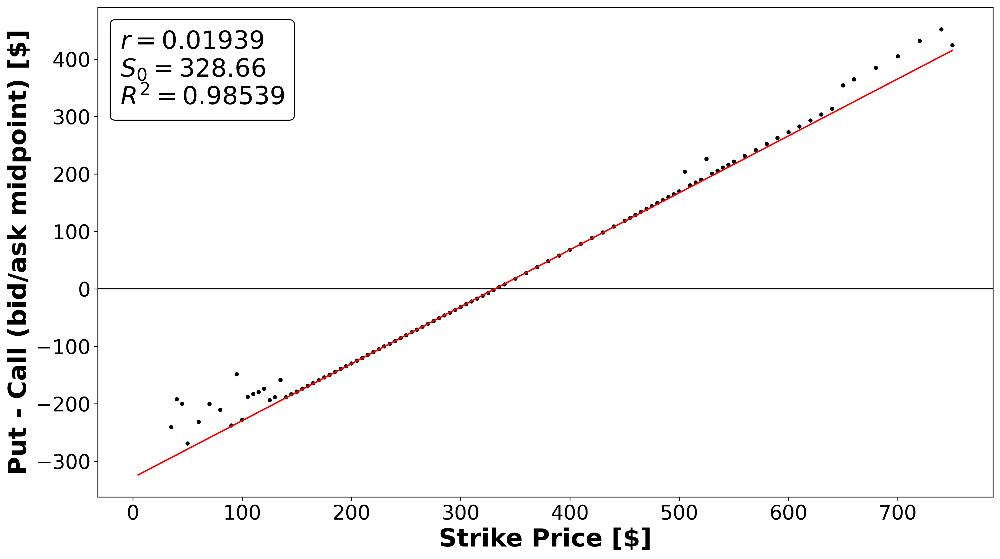

In [53]:
# Creating a figure with one subplot
fig = plt.figure()
fig, ax0 = plt.subplots(nrows=1, ncols=1, figsize = (16,9), dpi=300)

# Regression Parameters
alpha = subset.loc[0,"alpha"]
beta = subset.loc[0, "beta"]

# R2 calculated using the regression parameters of near-the-money regression for all options with specified expiration date
# R2 = 1 - SSR/TSS
pred = np.array([alpha + subset["strike"][i]*beta if not(np.isnan(subset["cp_diff"][i])) else np.nan for i in subset.index])
r2 = 1 - np.nansum(np.square(subset["cp_diff"]-pred))/np.nansum(np.square(subset["cp_diff"]-np.mean(subset["cp_diff"])))

# Plotting the Put-Call Parity
ax0.axhline(0,color="black", linewidth=1)
ax0.plot(subset["strike"], alpha + beta*subset["strike"], color = "red")
ax0.scatter(subset["strike"], subset["cp_diff"], color = "black", s=10)
ax0.set_xlabel("Strike Price [$]", size=25, weight="bold")
ax0.set_ylabel("Put - Call (bid/ask midpoint) [$]", size=25, weight="bold")
ax0.tick_params(axis="both", labelsize=20)

# Annotation with R2 and implied parameters
at = AnchoredText("$r=$"+str(round(r,5))+"\n$S_0=$"+str(round(S_0,2))+"\n$R^2=$"+str(round(r2,5)), prop=dict(size=25), frameon=True, loc='upper left')
at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2")
ax0.add_artist(at)

Comparing the calculated prices of the subset to the actual market prices and calculating the percentage errors.

(0.0, 787.25)

<Figure size 432x288 with 0 Axes>

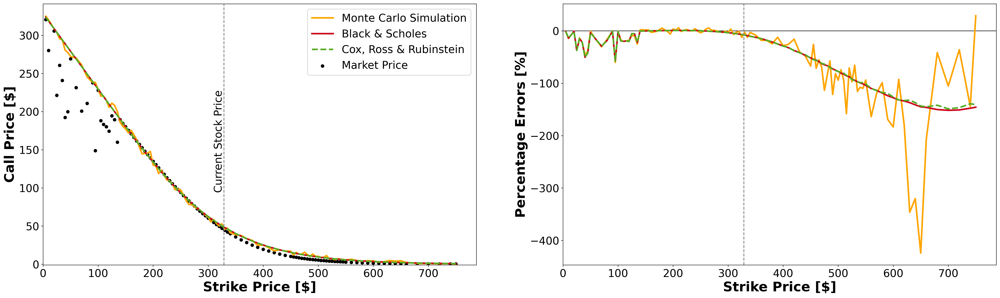

In [38]:
# Creating a figure with two subplot #
fig = plt.figure()
fig, (ax0, ax1) = plt.subplots(nrows=1, ncols=2, figsize = (32,9), dpi=300)

# Plotting the Price of European Call options
ax0.plot(subset["strike"], subset["C_MC"], color = "#ffA500", linewidth=3, label="Monte Carlo Simulation")
ax0.plot(subset["strike"], subset["C_BS"], color = "#CC071E", linewidth=3, label="Black & Scholes")
ax0.plot(subset["strike"], subset["C_CRR"], color = "#57AB27", linestyle="--", linewidth=3, label="Cox, Ross & Rubinstein")
ax0.scatter(subset["strike"], subset["midpoint"], color = "black", label="Market Price", s=30)
ax0.axvline(S_0 ,linestyle = "--", color = "0.5")
ax0.set_xlim(0)
ax0.set_ylim(-1)
ax0.set_xlabel("Strike Price [$]", size = 25, weight = "bold")
ax0.set_ylabel("Call Price [$]", size = 25, weight = "bold")
ax0.tick_params(axis="both", labelsize=20)

# Annote the vertical line
textx = S_0-np.max(subset["strike"])*0.025
texty = (np.max(subset["midpoint"])-np.min(subset["midpoint"]))*0.3+np.min(subset["midpoint"])
ax0.text(textx,texty,'Current Stock Price',rotation=90, size=20)

# Show legend
ax0.legend(fontsize=20, framealpha=1)

# Plotting the errors
ax1.axhline(0, color = "black", linewidth = 1)
ax1.plot(subset["strike"], (subset["midpoint"]-subset["C_MC"])/subset["midpoint"]*100, color = "#ffA500", linewidth=3, label = "Monte Carlo Simulation")
ax1.plot(subset["strike"], (subset["midpoint"]-subset["C_BS"])/subset["midpoint"]*100, color = "#CC071E", linewidth=3, label = "Black & Scholes")
ax1.plot(subset["strike"], (subset["midpoint"]-subset["C_CRR"])/subset["midpoint"]*100, color = "#57AB27", linestyle="--", linewidth=3, label = "Cox, Ross & Rubinstein")
ax1.axvline(S_0 ,linestyle = "--", color = "0.5")
ax1.set_xlabel("Strike Price [$]", size=25, weight="bold")
ax1.set_ylabel("Percentage Errors [%]", size=25, weight="bold")
ax1.tick_params(axis="both", labelsize=20)
ax1.set_xlim(0)

------------------------------

# Task 5 - Implied Volatility

The difference in prices most likely stems from the difference in assumed future volatility. What is the volatility that the market predicts for this option (implied volatility of the option)? Write a function to compute the implied volatility for any given option.

Define function to calculate implied volatility based on the **Black-Scholes model**:

In [39]:
def Call_impVol_blackscholes (C: float, S_0: float, r: float, T: float, K:float):
    # Check if implied volatility can be calculated (limit of Black Scholes Price for sigma --> 0)
    if S_0 - K*exp(-r*T) > C:
        return np.nan
  
    # Defining a reasonable interval for the volatility
    sigma_low = 0.0
    sigma_high = 100.0

    # Size of the interval
    size = sigma_high - sigma_low

    # Set sigma to the midpoint of the interval int_sigma
    sigma_mid = (sigma_high + sigma_low)/2

    # While the intervall is bigger than specified 
    while size > 0.0000001:

        # Calculate the corresponding value of the call option using the Black-Scholes Model
        C_BS = Call_blackscholes(S_0,r,sigma_mid,T,K)
    
        # Compare the calculated price to the market price
        if C_BS > C:
            sigma_high = sigma_mid
        else:
            sigma_low = sigma_mid
    
        # Recalculate the size of the intervall
        size = sigma_high - sigma_low

        # Reset sigma to the midpoint of the interval
        sigma_mid = (sigma_high + sigma_low)/2
  
    # Return sigma
    return sigma_mid

Plot implied volatility for all call options on the **Netflix stock**:

<Figure size 432x288 with 0 Axes>

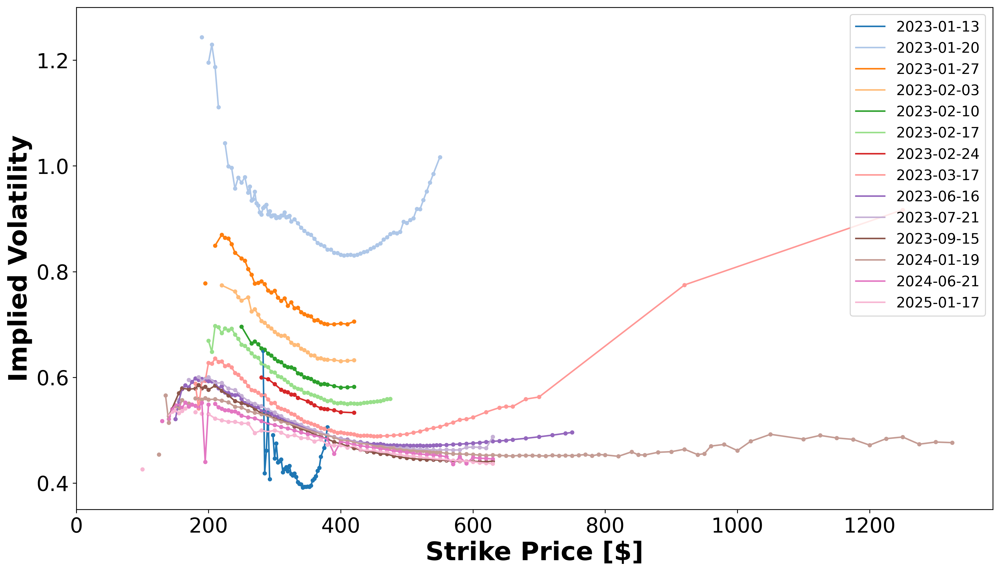

In [40]:
### Calculating the implied volatility of the call options ###

# Create an empty numpy array to store calculation results
impVol = np.array([])

# Use the above defined function to calculate the implied volatility
for i in calls.index:
    C = calls["midpoint"][i]
    S_0 = calls["S_0"][i]
    r = calls["riskfree rate"][i]
    T = calls["T_years"][i]
    K = calls["strike"][i]
    impVol = np.concatenate((impVol, [Call_impVol_blackscholes(C, S_0, r, T, K)]))

calls["impVol(BS)"] = impVol

### Plotting the implied volatility ###
# Creating a figure with one subplot
fig = plt.figure()
fig, ax0 = plt.subplots(nrows=1, ncols=1, figsize = (16,9), dpi=300)

# Plotting the data
ax0.set_prop_cycle(color = plt.get_cmap("tab20").colors)
for e in expiration:
    ax0.plot(calls[calls["expiration"]==e]["strike"], calls[calls["expiration"]==e]["impVol(BS)"], label=e)
    ax0.scatter(calls[calls["expiration"]==e]["strike"], calls[calls["expiration"]==e]["impVol(BS)"], s=10)
ax0.set_xlim(0)
ax0.set_ylim(0.35,1.3)
ax0.set_xlabel("Strike Price [$]", size=25, weight="bold")
ax0.set_ylabel("Implied Volatility", size=25, weight="bold")
ax0.tick_params(axis="both", labelsize=20)
ax0.legend(loc="upper right", fontsize=14)

# Extention - Exotic Options

## Barrier Options: Up-and-Out Put Barrier Option

An Up-and-Out Barrier Option is a type of option that is only activated when the price of the underlying asset reaches or exceeds a certain predetermined barrier level. Once the barrier is reached, the option is terminated, and the holder no longer has the right to exercise it. To simulate the price of such option using Monte Carlo simulation the following steps must be considered. Therefore, the Monto Carlo simulation described above must be modified to take the barrier level into account.


In this example the option price of an Up-and-Out Barrier Option is simulated with the following parameters:

In [41]:
# Parameters of the underlying asset
# same as Task 1 (Addition: Barrier H)
S_0 = 100 #Current stock Price
r = 0.01 #risk free interest rate
sigma = 0.2 #volatility
T = 1 #Time to maturity 1 year = 1, 1 months = 1/12
K = 100 #Strike Price
q = 0 #dividend yield
steps = 100 # time steps
N = 1000 # number of trials
H = 125  # up-and-out barrier price/value

Calculating the price of the option:

In [42]:
# Set seed for reproducibility
np.random.seed(0)

#simulating the paths
def geo_paths(S_0, T, r, q, sigma, steps, N):

    dt = T/steps
    #S_{T} = ln(S_{0})+\int_{0}^T(\mu-\frac{\sigma^2}{2})dt+\int_{0}^T \sigma dW(t)
    ST = np.log(S_0) +  np.cumsum(((r - q - sigma**2/2)*dt +\
                              sigma*np.sqrt(dt) * \
                              np.random.normal(size=(steps,N))),axis=0)
    
    return np.exp(ST)


ST = geo_paths(S_0, T, r, q, sigma, steps, N)

# Copy numpy array for plotting
S_PLOT = np.copy(ST)

# Apply Barrier Condition to ST numpy array
mask = np.any(ST >= H, axis=0)
ST[:,mask] = 0
CT = np.maximum(0, K - ST[-1][ST[-1] != 0])
C0 = np.exp(-r*T)*np.sum(CT)/N

# Print the result
print("Put value is ${0}".format(np.round(C0,2)))

Put value is $7.08


Visualisation of the results:

<Figure size 432x288 with 0 Axes>

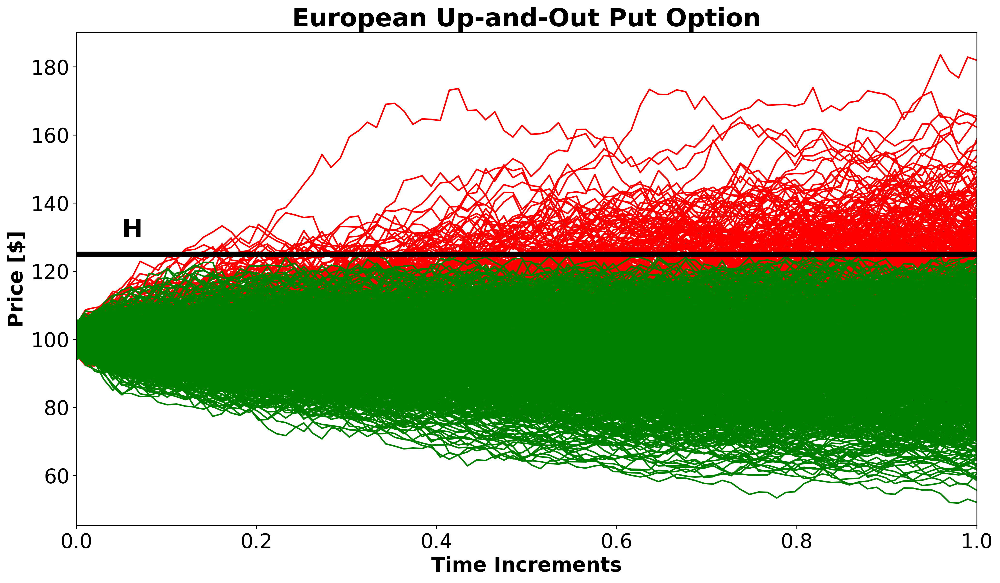

In [46]:
# Creating a figure with one subplot
fig = plt.figure()
fig, ax0 = plt.subplots(nrows=1, ncols=1, figsize = (16,9), dpi=300)

# Plotting the paths
ax0.plot(np.linspace(0,T,steps),S_PLOT[:,mask],'r')
ax0.plot(np.linspace(0,T,steps),S_PLOT[:,~mask],'g')
ax0.plot([0,T],[H,H], 'k-',linewidth=5.0)
ax0.annotate('H', (0.05,130), size=25, weight="bold")
ax0.set_xlim(0,1)
ax0.set_xlabel('Time Increments', size=20, weight="bold")
ax0.set_ylabel('Price [$]', size=20, weight="bold")
ax0.set_title('European Up-and-Out Put Option', size=25, weight="bold")
ax0.tick_params(axis="both", labelsize=20)

# Figures for the paper
In this section figures unrelated to any specific task are be generated for the purpose of presenting them in the paper.

## Exchange traded open market size

<Figure size 432x288 with 0 Axes>

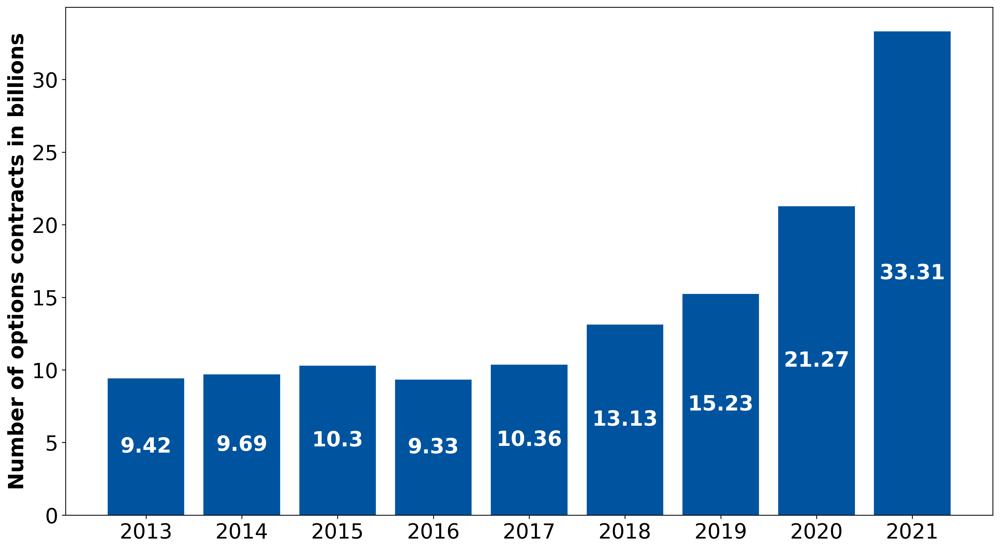

In [50]:
# Data (from Statista - Source in the paper)
years = np.array([str(i) for i in range(2013, 2022)])
options = np.array([9.42,9.69,10.30,9.33,10.36,13.13,15.23,21.27,33.31])

# Plot the data
fig = plt.figure()
fig, ax0 = plt.subplots(nrows=1, ncols=1, figsize = (16,9), dpi=300)

bar = ax0.bar(years, options, color = "#00549f")
ax0.bar_label(bar, label=options, label_type = "center", color="1.0", size = 20, weight = "bold")
ax0.set_ylabel("Number of options contracts in billions", size = 20, weight="bold")
ax0.tick_params(axis="both", labelsize=20)
#ax0.annotate("", xy=(0.865, 0.94), xycoords='axes fraction', xytext=("2020",21.8), textcoords='data',arrowprops=dict(width=4, connectionstyle="arc3,rad=-0.4", color="0.0"))
#ax0.text("2020",27,"+"+str(round((options[8]-options[7])/options[7]*100,0))+"%",bbox={'facecolor': 'white', 'pad': 8},fontsize=20, weight="bold",horizontalalignment="center")

## Payoffs and profits of Put and Call options

<Figure size 432x288 with 0 Axes>

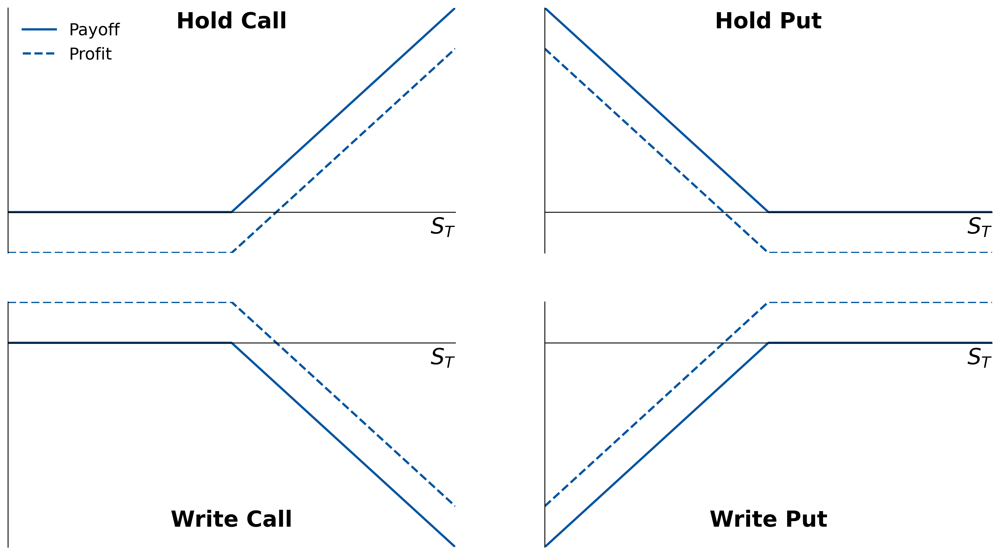

In [67]:
# Parameters
K = 50 # Strike Price
C = 10 # Price for Put and Call option
S_T = np.array(range(0,101))

# Payoffs and Profits of long position / short position on put and call options
C_T_long = np.array([max(i - K,0) for i in S_T])
C_T_short = -1*C_T_long
P_T_long = np.array([max(K - i,0) for i in S_T])
P_T_short = -1*P_T_long

payoffs = [C_T_long, P_T_long, C_T_short, P_T_short]
profits = [np.subtract(i,C) if np.max(i) > 0 else np.add(i,C) for i in payoffs]
labels = np.array(["Hold Call", "Hold Put","Write Call","Write Put"])

# Plotting the profits and payoffs
fig = plt.figure()

fig, ((ax0, ax1), (ax2, ax3)) = plt.subplots(nrows=2,ncols=2,figsize=(16,9),dpi=300)

axes = np.array([ax0, ax1, ax2,ax3])
i=0

for ax in axes:
    # Plot payoff and profit
    ax.plot(S_T, payoffs[i], linewidth=2, color="#00549f", label="Payoff")
    ax.plot(S_T, profits[i], linewidth=2, linestyle="--", color="#00549f", label="Profit")
    # Modify axis
    ax.set_xlim(0,100)
    ax.set_ylim(np.min(np.concatenate((payoffs[i],profits[i]))),np.max(np.concatenate((payoffs[i],profits[i]))))
    ax.spines["left"].set_position("zero")
    ax.spines["bottom"].set_position("zero")
    ax.spines["right"].set_color("none")
    ax.spines["top"].set_color("none")
    ax.tick_params(axis="both",which="both",bottom=False,left=False,labelbottom=False,labelleft=False)
    # Labels
    ax.set_xlabel("${S}_T$", loc="right", size=20)
    if i<2: y_coord = 45
    else: y_coord = -45
    ax.text(50,y_coord,labels[i],fontsize=20, weight="bold",horizontalalignment="center")

    i+=1

# Legend
ax0.legend(frameon=False,fontsize=15)